**Object Detection in Videos using Yolo Nas Model pretrained on coco dataset**

In [ ]:
%%capture
!pip install super-gradients==3.1.0
!pip install imutils
!pip install roboflow
!pip install pytube --upgrade

In [ ]:
from super_gradients.training import models

yolo_nas_l = models.get("yolo_nas_l", pretrained_weights="coco")

The console stream is logged into /home/u193499/sg_logs/console.log


[2023-06-07 11:19:14] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it


In [6]:
!pip install torchinfo
from torchinfo import summary

summary(model=yolo_nas_l, 
        input_size=(16, 3, 640, 640),
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Defaulting to user installation because normal site-packages is not writeable


Layer (type (var_name))                                           Input Shape          Output Shape         Param #              Trainable
YoloNAS_L (YoloNAS_L)                                             [16, 3, 640, 640]    [16, 8400, 4]        --                   True
├─NStageBackbone (backbone)                                       [16, 3, 640, 640]    [16, 96, 160, 160]   --                   True
│    └─YoloNASStem (stem)                                         [16, 3, 640, 640]    [16, 48, 320, 320]   --                   True
│    │    └─QARepVGGBlock (conv)                                  [16, 3, 640, 640]    [16, 48, 320, 320]   3,024                True
│    └─YoloNASStage (stage1)                                      [16, 48, 320, 320]   [16, 96, 160, 160]   --                   True
│    │    └─QARepVGGBlock (downsample)                            [16, 48, 320, 320]   [16, 96, 160, 160]   88,128               True
│    │    └─YoloNASCSPLayer (blocks)                     

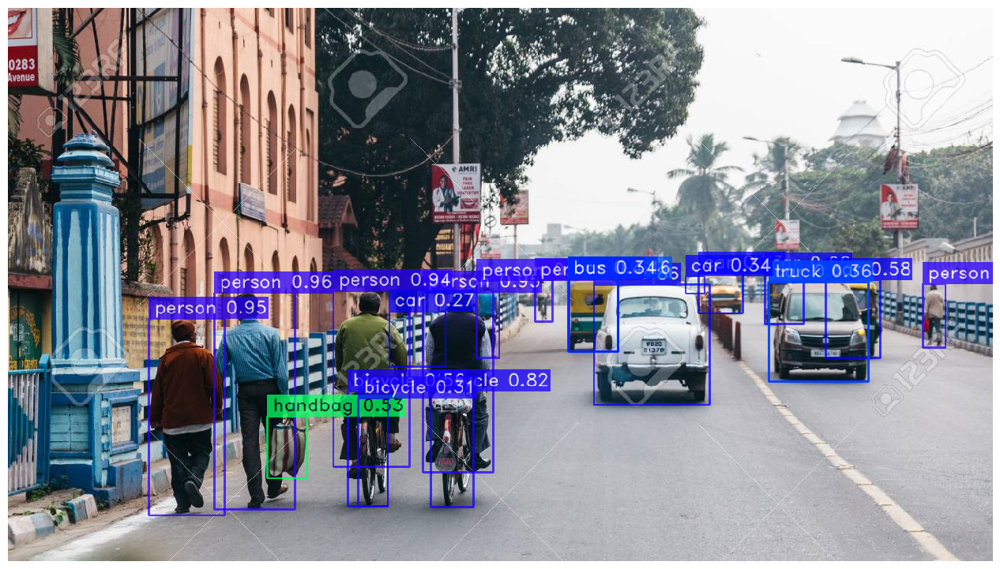

In [7]:
#url = "https://previews.123rf.com/images/freeograph/freeograph2011/freeograph201100150/158301822-group-of-friends-gathering-around-table-at-home.jpg"
url = "https://previews.123rf.com/images/artitwpd/artitwpd1706/artitwpd170600575/80514774-people-walking-riding-bicycle-and-cars-running-on-the-street-in-kolkata-india.jpg"
yolo_nas_l.predict(url, conf=0.25).show()

In [1]:
import torch
device = 'cuda' if torch.cuda.is_available() else "cpu"

In [17]:
#!gdown "https://drive.google.com/uc?id=1hl_NNFciFwImmqplL3RkozpiIa8I38cd&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1hl_NNFciFwImmqplL3RkozpiIa8I38cd&confirm=t
To: /home/u193499/Yolo_Nas/demo.mp4
100%|██████████████████████████████████████| 11.5M/11.5M [00:02<00:00, 4.04MB/s]


In [11]:
input_video_path = f"input_videos/car2.mp4"
output_video_path = "output_videos/detection4.mp4"

In [12]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
input_video_path = 'input_videos/car2.mp4'

# Compressed video path
output_video_path = "output_videos/detection4.mp4"

os.system(f"ffmpeg -i {input_video_path} -vcodec libx264 {output_video_path}")

# Show video
mp4 = open(output_video_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

ffmpeg version 4.2.7-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 9 (Ubuntu 9.4.0-1ubuntu1~20.04.1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --e

frame=  915 fps=138 q=-1.0 Lsize=    5345kB time=00:00:30.40 bitrate=1440.4kbits/s speed=4.57x    
video:5334kB audio:0kB subtitle:0kB other streams:0kB global headers:0kB muxing overhead: 0.214120%
[libx264 @ 0x5585e9d17a00] frame I:4     Avg QP:19.27  size: 21305
[libx264 @ 0x5585e9d17a00] frame P:246   Avg QP:21.19  size: 10946
[libx264 @ 0x5585e9d17a00] frame B:665   Avg QP:22.73  size:  4035
[libx264 @ 0x5585e9d17a00] consecutive B-frames:  0.9%  3.3% 10.2% 85.7%
[libx264 @ 0x5585e9d17a00] mb I  I16..4: 40.7% 47.9% 11.4%
[libx264 @ 0x5585e9d17a00] mb P  I16..4: 15.7% 14.4%  1.6%  P16..4: 41.1%  6.8%  1.9%  0.0%  0.0%    skip:18.5%
[libx264 @ 0x5585e9d17a00] mb B  I16..4:  1.7%  2.0%  0.2%  B16..8: 35.0%  3.1%  0.2%  direct: 3.4%  skip:54.4%  L0:50.8% L1:47.3% BI: 1.9%
[libx264 @ 0x5585e9d17a00] 8x8 transform intra:46.9% inter:83.5%
[libx264 @ 0x5585e9d17a00] coded y,uvDC,uvAC intra: 26.4% 26.6% 0.6% inter: 6.5% 13.1% 0.0%
[libx264 @ 0x5585e9d17a00] i16 v,h,dc,p: 13% 42% 14% 31%
[l

In [13]:
yolo_nas_l.to(device).predict(input_video_path).save(output_video_path)

Predicting Video: 100%|██████████| 915/915 [07:21<00:00,  2.07it/s]


In [14]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = 'output_videos/detection4.mp4'

# Compressed video path
compressed_path = "result_videos/result4.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

ffmpeg version 4.2.7-0ubuntu0.1 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 9 (Ubuntu 9.4.0-1ubuntu1~20.04.1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-avresample --disable-filter=resample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librsvg --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --e

frame=  915 fps=132 q=-1.0 Lsize=    6725kB time=00:00:30.40 bitrate=1812.3kbits/s speed=4.39x    
video:6715kB audio:0kB subtitle:0kB other streams:0kB global headers:0kB muxing overhead: 0.157838%
[libx264 @ 0x561069c12d00] frame I:4     Avg QP:19.78  size: 24126
[libx264 @ 0x561069c12d00] frame P:429   Avg QP:21.56  size: 10398
[libx264 @ 0x561069c12d00] frame B:482   Avg QP:23.20  size:  4809
[libx264 @ 0x561069c12d00] consecutive B-frames: 21.5% 19.5% 15.7% 43.3%
[libx264 @ 0x561069c12d00] mb I  I16..4: 41.9% 51.9%  6.2%
[libx264 @ 0x561069c12d00] mb P  I16..4: 10.1% 18.0%  0.8%  P16..4: 37.5%  5.7%  1.9%  0.0%  0.0%    skip:25.8%
[libx264 @ 0x561069c12d00] mb B  I16..4:  2.1%  4.3%  0.1%  B16..8: 39.3%  3.5%  0.2%  direct: 1.6%  skip:48.9%  L0:58.7% L1:39.5% BI: 1.8%
[libx264 @ 0x561069c12d00] 8x8 transform intra:62.6% inter:89.2%
[libx264 @ 0x561069c12d00] coded y,uvDC,uvAC intra: 33.3% 30.9% 2.0% inter: 7.1% 10.6% 1.3%
[libx264 @ 0x561069c12d00] i16 v,h,dc,p: 15% 57% 16% 11%
[l

In [ ]:
import intel_extension_for_pytorch as ipex
model = ipex.optimize(model)